# Preparation

- This section focuses on data exploration and modeling. We use a linear model (LM) to predict sale price and guide our data filtering, variable selection, and feature engineering. Multiple models were tested, and we selected the one with the best test accuracy, balanced simplicity, and strong generalizability.

In [281]:
import pandas as pd
import geopandas as gpd
import json
from shapely.wkt import loads as wkt_loads
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from linearmodels import OLS
from linearmodels.datasets import wage
from statsmodels.iolib.summary2 import summary_col
from sklearn.neighbors import NearestNeighbors
from pandas.api.types import is_categorical_dtype, is_object_dtype
from sklearn.metrics import mean_absolute_error, mean_squared_error
import folium
from folium.plugins import MarkerCluster
from folium.plugins import HeatMap

In [2]:
def load_jsonl(path):
    with open(path, 'r') as f:
        data = [json.loads(line) for line in f]
    return pd.DataFrame(data)

In [3]:
df_assessments = load_jsonl("data/opa_assessments_data.jsonl")
df_properties = load_jsonl("data/opa_properties_data.jsonl")
df_parcels = load_jsonl("data/pwd_parcels_data.jsonl")

In [ ]:
df_assessments

In [4]:
def parse_geog_column(df):
    df = df.copy() 
    if 'geog' in df.columns:
        df['geometry'] = df['geog'].apply(lambda x: wkt_loads(x) if isinstance(x, str) else None)
        gdf = gpd.GeoDataFrame(df, geometry='geometry', crs="EPSG:4326")
        return gdf
    else:
        return gpd.GeoDataFrame(df)

In [5]:
gdf_properties = parse_geog_column(df_properties)
gdf_parcels = parse_geog_column(df_parcels)

In [6]:
print(gdf_properties.columns)

Index(['objectid', 'assessment_date', 'basements', 'beginning_point',
       'book_and_page', 'building_code', 'building_code_description',
       'category_code', 'category_code_description', 'census_tract',
       'central_air', 'cross_reference', 'date_exterior_condition', 'depth',
       'exempt_building', 'exempt_land', 'exterior_condition', 'fireplaces',
       'frontage', 'fuel', 'garage_spaces', 'garage_type',
       'general_construction', 'geographic_ward', 'homestead_exemption',
       'house_extension', 'house_number', 'interior_condition', 'location',
       'mailing_address_1', 'mailing_address_2', 'mailing_care_of',
       'mailing_city_state', 'mailing_street', 'mailing_zip', 'market_value',
       'market_value_date', 'number_of_bathrooms', 'number_of_bedrooms',
       'number_of_rooms', 'number_stories', 'off_street_open',
       'other_building', 'owner_1', 'owner_2', 'parcel_number', 'parcel_shape',
       'quality_grade', 'recording_date', 'registry_number', 'sale_

# 1 Preliminary Analysis

## 1.1 Preliminary Feature Selection and Cleaning - Keep relevant property and spatial attributes

In [7]:
columns_to_keep = [
    'basements', 'category_code', 'census_tract', 'central_air', 'depth',
    'exterior_condition', 'fireplaces', 'frontage', 'garage_spaces',
    'general_construction', 'interior_condition',
    'number_of_bathrooms', 'number_of_bedrooms', 'number_stories',
    'off_street_open', 'parcel_shape', 'quality_grade', 'sale_price',
    'topography', 'total_area', 'total_livable_area', 'type_heater',
    'view_type', 'year_built', 'zoning', 'geometry'
]

gdf_properties = gdf_properties[columns_to_keep]

In [8]:
# categorical
gdf_properties['basements'] = gdf_properties['basements'].astype('category')
gdf_properties['category_code'] = gdf_properties['category_code'].astype('category')
gdf_properties['census_tract'] = gdf_properties['census_tract'].astype('category')
gdf_properties['central_air'] = gdf_properties['central_air'].astype('category')
gdf_properties['exterior_condition'] = gdf_properties['exterior_condition'].astype('category')
gdf_properties['general_construction'] = gdf_properties['general_construction'].astype('category')
gdf_properties['interior_condition'] = gdf_properties['interior_condition'].astype('category')
gdf_properties['parcel_shape'] = gdf_properties['parcel_shape'].astype('category')
gdf_properties['quality_grade'] = gdf_properties['quality_grade'].astype('category')
gdf_properties['topography'] = gdf_properties['topography'].astype('category')
gdf_properties['type_heater'] = gdf_properties['type_heater'].astype('category')
gdf_properties['view_type'] = gdf_properties['view_type'].astype('category')
gdf_properties['zoning'] = gdf_properties['zoning'].astype('category')

# numeric
gdf_properties['depth'] = pd.to_numeric(gdf_properties['depth'], errors='coerce')
gdf_properties['fireplaces'] = pd.to_numeric(gdf_properties['fireplaces'], errors='coerce')
gdf_properties['frontage'] = pd.to_numeric(gdf_properties['frontage'], errors='coerce')
gdf_properties['garage_spaces'] = pd.to_numeric(gdf_properties['garage_spaces'], errors='coerce')
gdf_properties['number_of_bathrooms'] = pd.to_numeric(gdf_properties['number_of_bathrooms'], errors='coerce')
gdf_properties['number_of_bedrooms'] = pd.to_numeric(gdf_properties['number_of_bedrooms'], errors='coerce')
gdf_properties['number_stories'] = pd.to_numeric(gdf_properties['number_stories'], errors='coerce')
gdf_properties['off_street_open'] = pd.to_numeric(gdf_properties['off_street_open'], errors='coerce')
gdf_properties['sale_price'] = pd.to_numeric(gdf_properties['sale_price'], errors='coerce')
gdf_properties['total_area'] = pd.to_numeric(gdf_properties['total_area'], errors='coerce')
gdf_properties['total_livable_area'] = pd.to_numeric(gdf_properties['total_livable_area'], errors='coerce')
gdf_properties['year_built'] = pd.to_numeric(gdf_properties['year_built'], errors='coerce')

## 1.2 Independent Variable Exploration

In [9]:
# sale price range
sale_prices = gdf_properties['sale_price'].dropna()
bins = list(range(0, int(sale_prices.max()) + 250_000, 250_000))

labels = [f"${int(b/1000)}k–${int(bins[i+1]/1000)}k" for i, b in enumerate(bins[:-1])]

price_ranges = pd.cut(sale_prices, bins=bins, labels=labels, include_lowest=True, right=False)

range_counts = price_ranges.value_counts().sort_index()
range_percents = (range_counts / range_counts.sum()).round(4)

price_range_table = pd.DataFrame({
    'Count': range_counts,
    'Percentage': range_percents
})
price_range_table

,Count,Percentage
$0k–$250k,481901,0.8289
$250k–$500k,66339,0.1141
$500k–$750k,15813,0.0272
$750k–$1000k,5486,0.0094
$1000k–$1250k,2364,0.0041
...,...,...
$966750k–$967000k,0,0.0000
$967000k–$967250k,0,0.0000
$967250k–$967500k,0,0.0000
$967500k–$967750k,0,0.0000


- The distribution of sale_price is highly right-skewed, with over 82% of observations concentrated in the $0k–$250k range. A non-negligible number of records have a value of exactly 1, which is clearly erroneous and has been noted for exclusion. 
- In addition, the tail of the distribution contains extremely high values that contribute little to the overall data structure but significantly distort visualization and statistical summaries. We will further assess the validity of these maximum values and exclude them from analysis if deemed outliers.

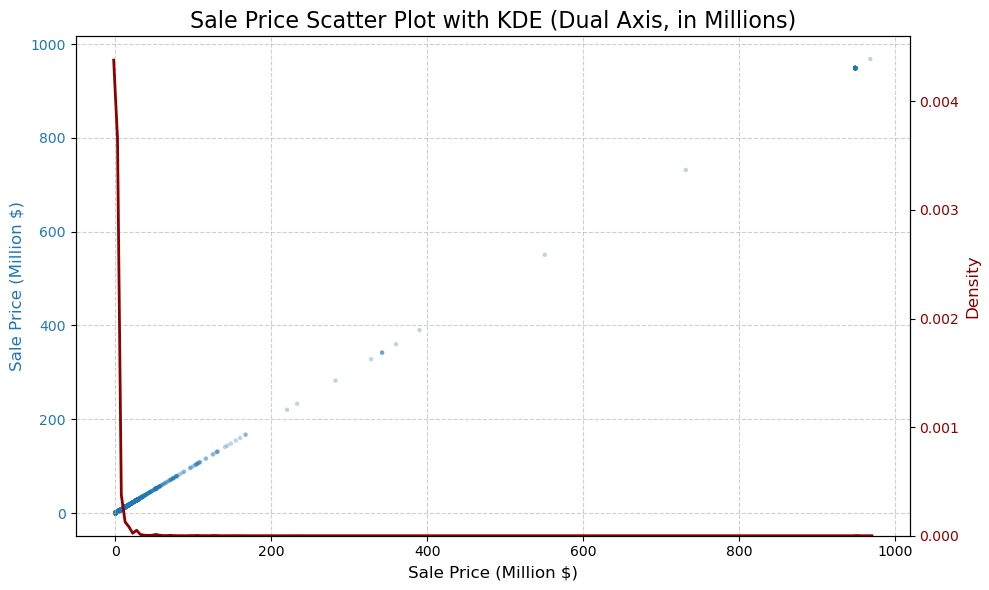

In [10]:
# Sale Price Scatter Plot with KDE 1

sale_prices = gdf_properties['sale_price'].dropna()
sale_prices_m = sale_prices / 1_000_000

fig, ax1 = plt.subplots(figsize=(10, 6))

ax1.scatter(sale_prices_m, sale_prices_m, alpha=0.3, s=10, color="#1f77b4", edgecolor='none', label='Sale Price Points')
ax1.set_xlabel("Sale Price (Million $)", fontsize=12)
ax1.set_ylabel("Sale Price (Million $)", fontsize=12, color='#1f77b4')
ax1.ticklabel_format(style='plain', axis='x')
ax1.tick_params(axis='y', labelcolor='#1f77b4')
ax1.grid(True, linestyle='--', alpha=0.6)

ax2 = ax1.twinx()
sns.kdeplot(sale_prices_m, ax=ax2, color='darkred', linewidth=2, label='Density Curve')
ax2.set_ylabel("Density", fontsize=12, color='darkred')
ax2.tick_params(axis='y', labelcolor='darkred')

plt.title("Sale Price Scatter Plot with KDE (Dual Axis, in Millions)", fontsize=16)
fig.tight_layout()
plt.show()

- The distribution of sale prices is extremely right-skewed, with a sharp concentration of values below $1 million. The KDE curve shows a steep density drop-off after the initial peak, indicating that most properties are clustered at relatively low price points. The presence of a long tail and extreme outliers—reaching up to $900+ million—suggests data entry anomalies or special-use properties. These high-end values significantly distort the overall scale and may require exclusion or separate treatment in downstream analysis.
- In addition to removing records where sale_price equals 1, we further exclude properties with sale prices above $200 million. These extreme values represent less than 1% of the dataset but have a disproportionate impact on scale, distribution, and downstream modeling. Their exclusion ensures a more representative and interpretable analysis of the broader housing market.

In [11]:
gdf_properties = gdf_properties[
    (gdf_properties['sale_price'] != 1) &
    (gdf_properties['sale_price'] <= 200_000_000)
]

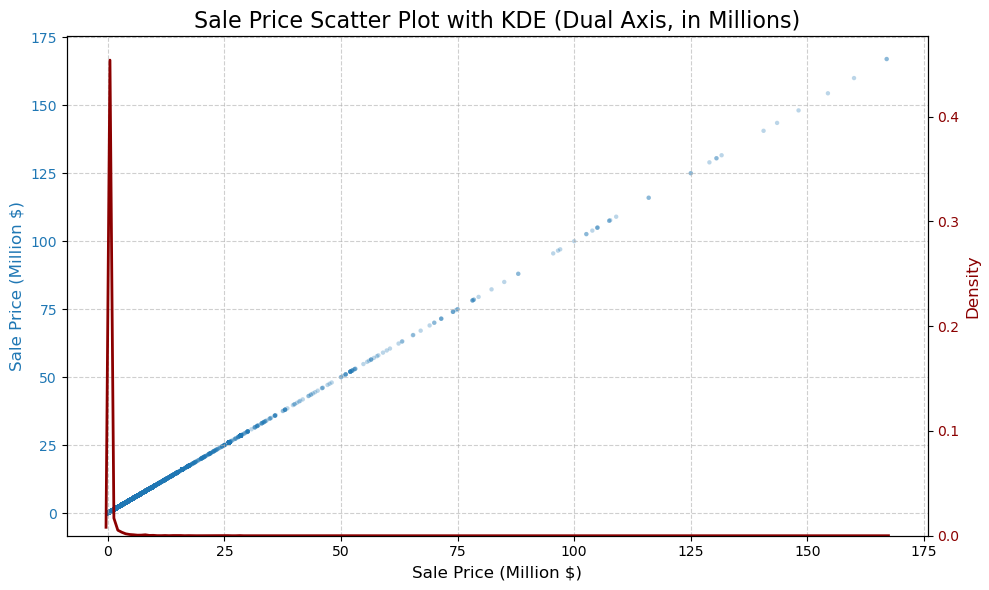

In [12]:
# Sale Price Scatter Plot with KDE 2

sale_prices = gdf_properties['sale_price'].dropna()
sale_prices_m = sale_prices / 1_000_000

fig, ax1 = plt.subplots(figsize=(10, 6))

ax1.scatter(sale_prices_m, sale_prices_m, alpha=0.3, s=10, color="#1f77b4", edgecolor='none', label='Sale Price Points')
ax1.set_xlabel("Sale Price (Million $)", fontsize=12)
ax1.set_ylabel("Sale Price (Million $)", fontsize=12, color='#1f77b4')
ax1.ticklabel_format(style='plain', axis='x')
ax1.tick_params(axis='y', labelcolor='#1f77b4')
ax1.grid(True, linestyle='--', alpha=0.6)

ax2 = ax1.twinx()
sns.kdeplot(sale_prices_m, ax=ax2, color='darkred', linewidth=2, label='Density Curve')
ax2.set_ylabel("Density", fontsize=12, color='darkred')
ax2.tick_params(axis='y', labelcolor='darkred')

plt.title("Sale Price Scatter Plot with KDE (Dual Axis, in Millions)", fontsize=16)
fig.tight_layout()
plt.show()

- In addition to removing records where sale_price equals 1, we also exclude observations with values below $1,000. These low-price entries may represent data entry errors or non-standard transactions (e.g., transfers, token sales) and are unlikely to reflect market-based property values. Their removal further improves the integrity of the dataset for analysis.

In [13]:
gdf_properties1 = gdf_properties[
    (gdf_properties['sale_price'] >= 5_000)
].dropna(subset=['sale_price'])

## 1.3 Preliminary Dependent Variable Exploration

### 1.3.1 Missing Value Check

In [14]:
# Replace empty strings, spaces, tabs, and other whitespace-only entries with NaN
gdf_properties1 = gdf_properties1.replace(r'^\s*$', np.nan, regex=True)

In [15]:
# missing value check
dtypes = gdf_properties1.dtypes.astype(str)
missing_ratios = gdf_properties1.isna().mean().round(4)
summary_v1 = pd.DataFrame({
    'Data Type': dtypes,
    'Missing Ratio': missing_ratios
})
summary_v1

,Data Type,Missing Ratio
basements,category,0.3734
category_code,category,0.0000
census_tract,category,0.0001
central_air,category,0.4275
depth,float64,0.0065
exterior_condition,category,0.0426
fireplaces,float64,0.1134
frontage,float64,0.0065
garage_spaces,float64,0.1170
general_construction,category,0.0733


- As the proportion of missing values for most variables is below 15%, we retain them at this stage and proceed by dropping rows with any missing values.
- Drop 'basements', 'central_air', and 'type_heater' due to high missing values

In [16]:
# Drop 'basements', 'central_air', and 'type_heater' due to high missing values
gdf_properties1 = gdf_properties1.drop(columns=['basements', 'central_air', 'type_heater'])

In [17]:
gdf_properties_cleaned1 = gdf_properties1.dropna()
(len(gdf_properties1)-len(gdf_properties_cleaned1))/len(gdf_properties1)

0.20112272356207733

- Dropped 20% data.

### 1.3.2 Feature Engineering Check

- Check numeric variables for linearity. (sale_price - depth, fireplaces, frontage, garage_spaces, number_of_bathrooms, number_of_bedrooms, number_stories, off_street_open, total_area, total_livable_area, year_built)

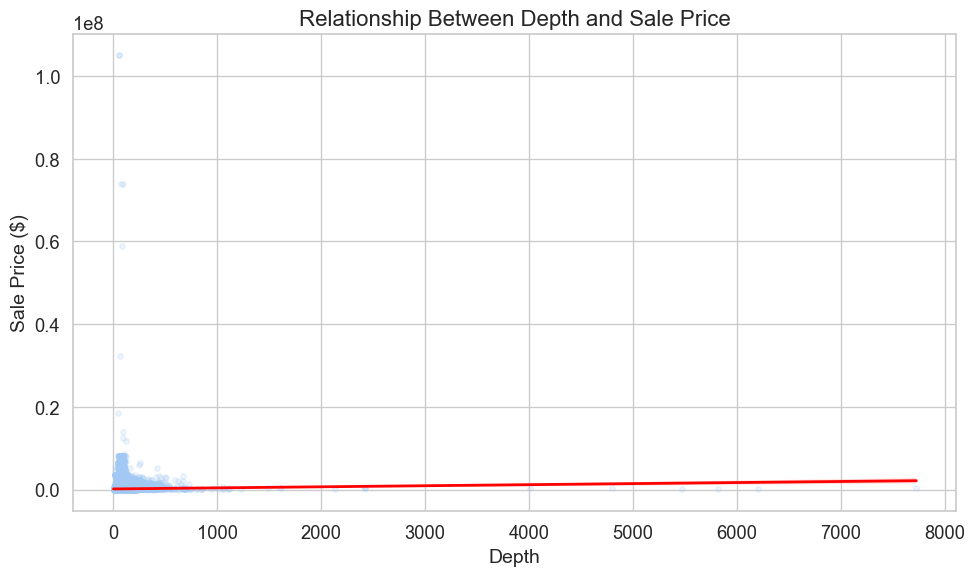

In [18]:
# depth

sns.set(style="whitegrid", palette="pastel", font_scale=1.2)

data = gdf_properties_cleaned1[['sale_price', 'depth']]
data = data[(data['depth'] > 0)]

plt.figure(figsize=(10, 6))
sns.regplot(x='depth', y='sale_price', data=data, scatter_kws={'alpha':0.2, 's':15}, line_kws={"color":"red", "lw":2})

plt.title('Relationship Between Depth and Sale Price', fontsize=16)
plt.xlabel('Depth', fontsize=14)
plt.ylabel('Sale Price ($)', fontsize=14)

plt.tight_layout()
plt.show()


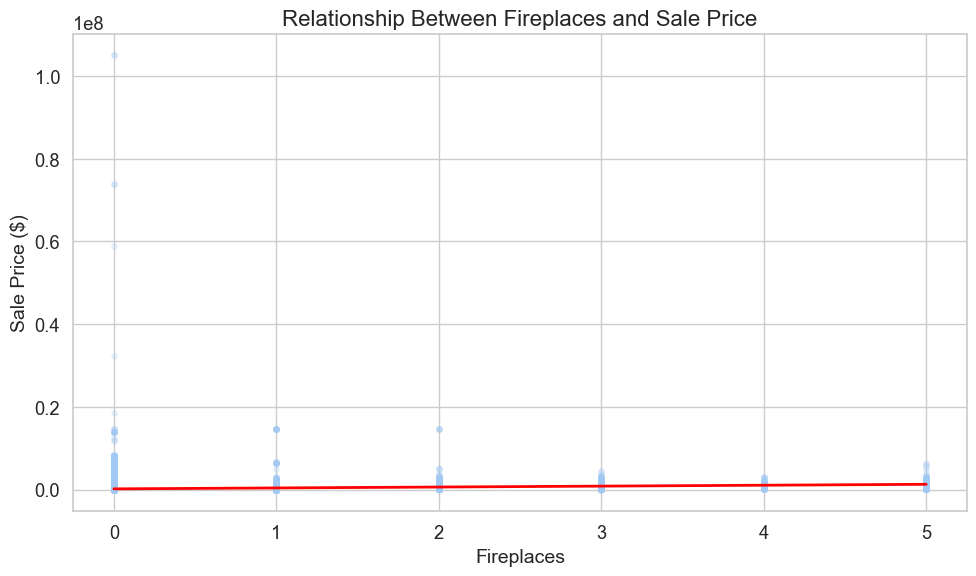

In [19]:
# fireplaces

sns.set(style="whitegrid", palette="pastel", font_scale=1.2)

data = gdf_properties_cleaned1[['sale_price', 'fireplaces']]

plt.figure(figsize=(10, 6))
sns.regplot(x='fireplaces', y='sale_price', data=data, scatter_kws={'alpha':0.2, 's':15}, line_kws={"color":"red", "lw":2})

plt.title('Relationship Between Fireplaces and Sale Price', fontsize=16)
plt.xlabel('Fireplaces', fontsize=14)
plt.ylabel('Sale Price ($)', fontsize=14)

plt.tight_layout()
plt.show()


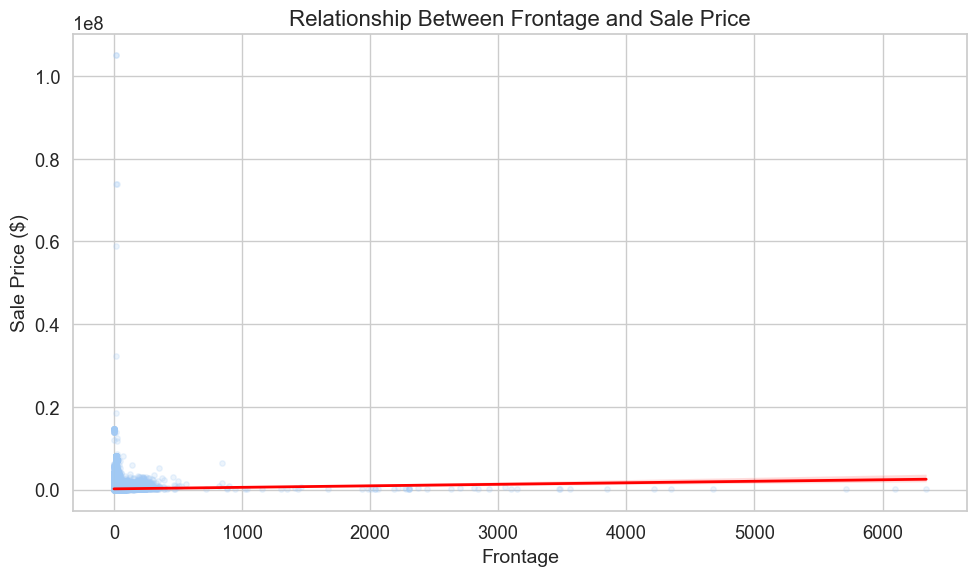

In [20]:
# frontage

sns.set(style="whitegrid", palette="pastel", font_scale=1.2)

data = gdf_properties_cleaned1[['sale_price', 'frontage']]

plt.figure(figsize=(10, 6))
sns.regplot(x='frontage', y='sale_price', data=data, scatter_kws={'alpha':0.2, 's':15}, line_kws={"color":"red", "lw":2})

plt.title('Relationship Between Frontage and Sale Price', fontsize=16)
plt.xlabel('Frontage', fontsize=14)
plt.ylabel('Sale Price ($)', fontsize=14)

plt.tight_layout()
plt.show()


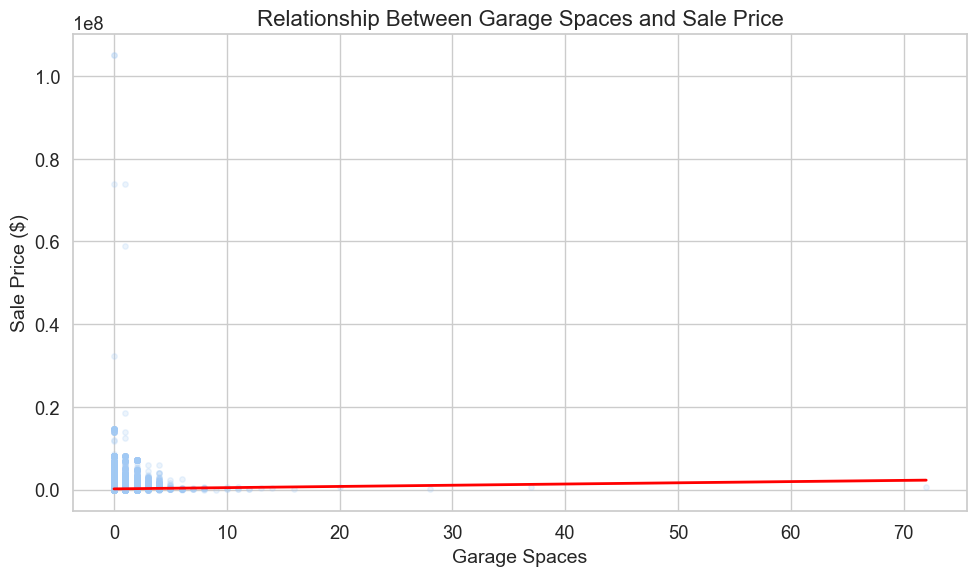

In [21]:
# garage_spaces

sns.set(style="whitegrid", palette="pastel", font_scale=1.2)

data = gdf_properties_cleaned1[['sale_price', 'garage_spaces']]

plt.figure(figsize=(10, 6))
sns.regplot(x='garage_spaces', y='sale_price', data=data, scatter_kws={'alpha':0.2, 's':15}, line_kws={"color":"red", "lw":2})

plt.title('Relationship Between Garage Spaces and Sale Price', fontsize=16)
plt.xlabel('Garage Spaces', fontsize=14)
plt.ylabel('Sale Price ($)', fontsize=14)

plt.tight_layout()
plt.show()


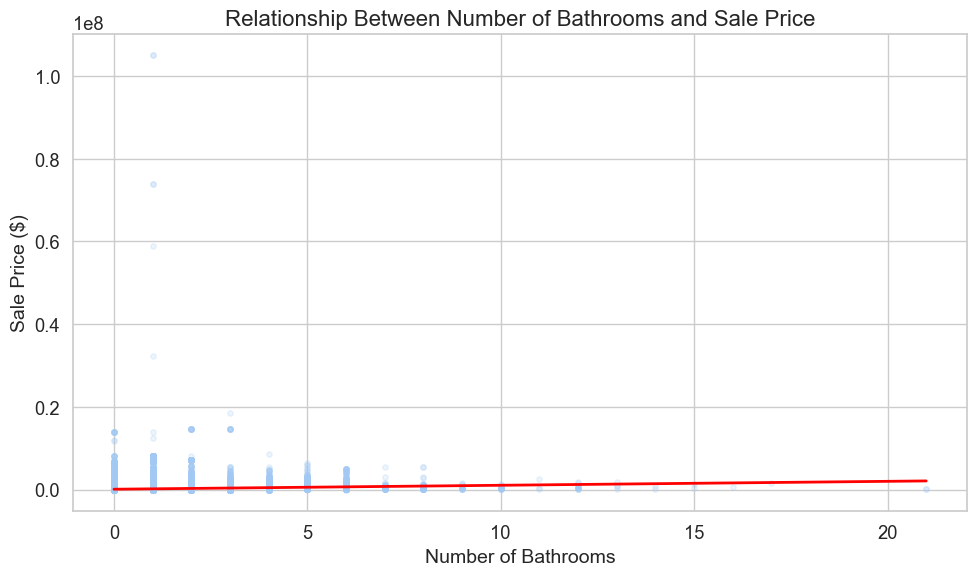

In [22]:
# number_of_bathrooms

sns.set(style="whitegrid", palette="pastel", font_scale=1.2)

data = gdf_properties_cleaned1[['sale_price', 'number_of_bathrooms']]

plt.figure(figsize=(10, 6))
sns.regplot(x='number_of_bathrooms', y='sale_price', data=data, scatter_kws={'alpha':0.2, 's':15}, line_kws={"color":"red", "lw":2})

plt.title('Relationship Between Number of Bathrooms and Sale Price', fontsize=16)
plt.xlabel('Number of Bathrooms', fontsize=14)
plt.ylabel('Sale Price ($)', fontsize=14)

plt.tight_layout()
plt.show()


In [23]:
# Remove entries from gdf_properties_cleaned1 where number_of_bathrooms is greater than 20.
gdf_properties_cleaned1 = gdf_properties_cleaned1[gdf_properties_cleaned1['number_of_bathrooms'] <= 20]

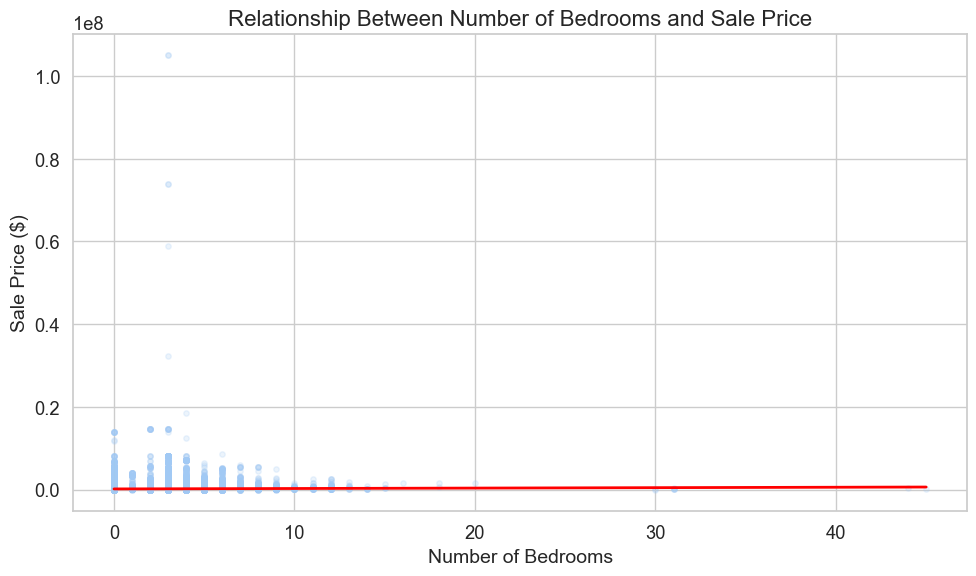

In [24]:
# number_of_bedrooms

sns.set(style="whitegrid", palette="pastel", font_scale=1.2)

data = gdf_properties_cleaned1[['sale_price', 'number_of_bedrooms']]

plt.figure(figsize=(10, 6))
sns.regplot(x='number_of_bedrooms', y='sale_price', data=data, scatter_kws={'alpha':0.2, 's':15}, line_kws={"color":"red", "lw":2})

plt.title('Relationship Between Number of Bedrooms and Sale Price', fontsize=16)
plt.xlabel('Number of Bedrooms', fontsize=14)
plt.ylabel('Sale Price ($)', fontsize=14)

plt.tight_layout()
plt.show()


In [25]:
# Remove entries from gdf_properties_cleaned1 where number_of_bedrooms is greater than 40.
gdf_properties_cleaned1 = gdf_properties_cleaned1[gdf_properties_cleaned1['number_of_bedrooms'] <= 40]

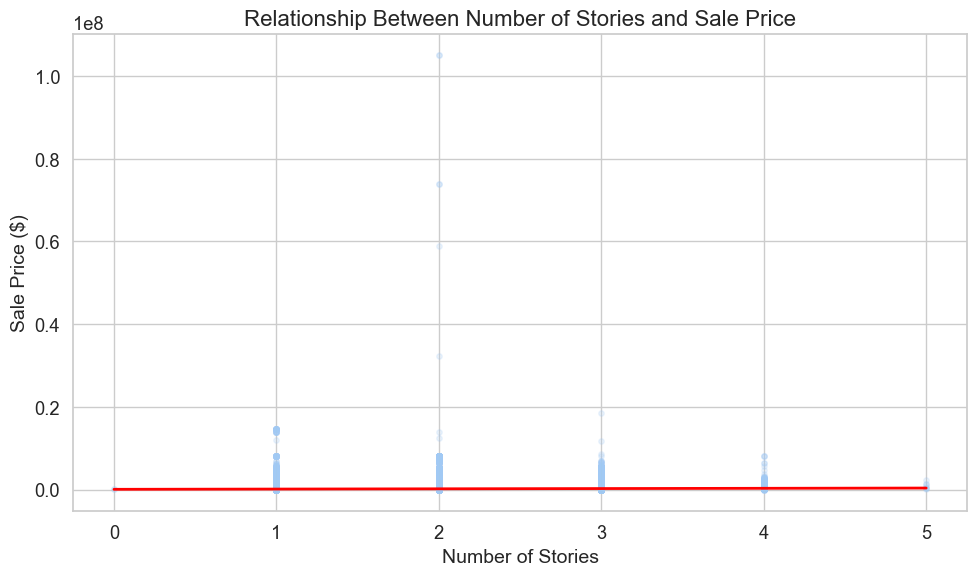

In [26]:
# number_stories

sns.set(style="whitegrid", palette="pastel", font_scale=1.2)

data = gdf_properties_cleaned1[['sale_price', 'number_stories']]

plt.figure(figsize=(10, 6))
sns.regplot(x='number_stories', y='sale_price', data=data, scatter_kws={'alpha':0.2, 's':15}, line_kws={"color":"red", "lw":2})

plt.title('Relationship Between Number of Stories and Sale Price', fontsize=16)
plt.xlabel('Number of Stories', fontsize=14)
plt.ylabel('Sale Price ($)', fontsize=14)

plt.tight_layout()
plt.show()


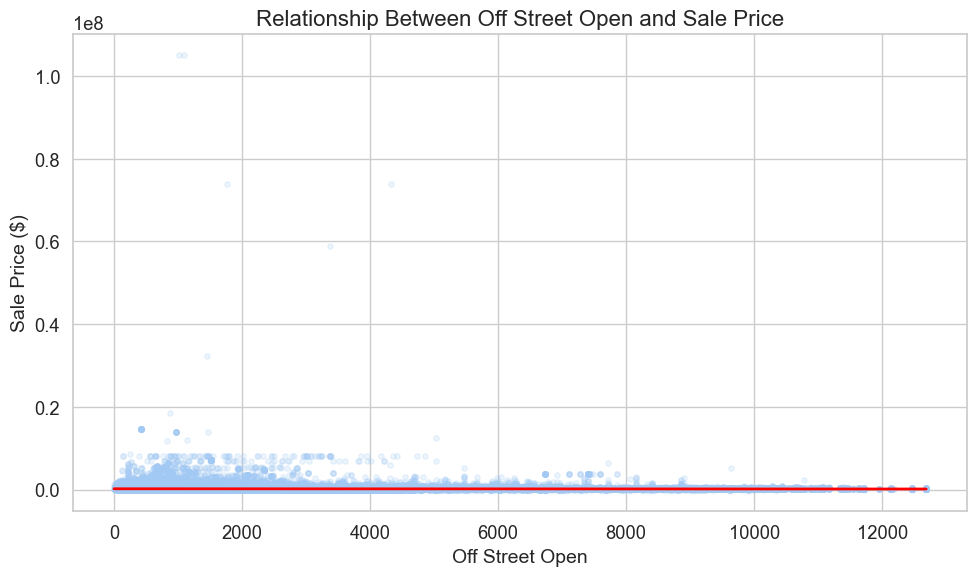

In [27]:
# off_street_open

sns.set(style="whitegrid", palette="pastel", font_scale=1.2)

data = gdf_properties_cleaned1[['sale_price', 'off_street_open']]

plt.figure(figsize=(10, 6))
sns.regplot(x='off_street_open', y='sale_price', data=data, scatter_kws={'alpha':0.2, 's':15}, line_kws={"color":"red", "lw":2})

plt.title('Relationship Between Off Street Open and Sale Price', fontsize=16)
plt.xlabel('Off Street Open', fontsize=14)
plt.ylabel('Sale Price ($)', fontsize=14)

plt.tight_layout()
plt.show()


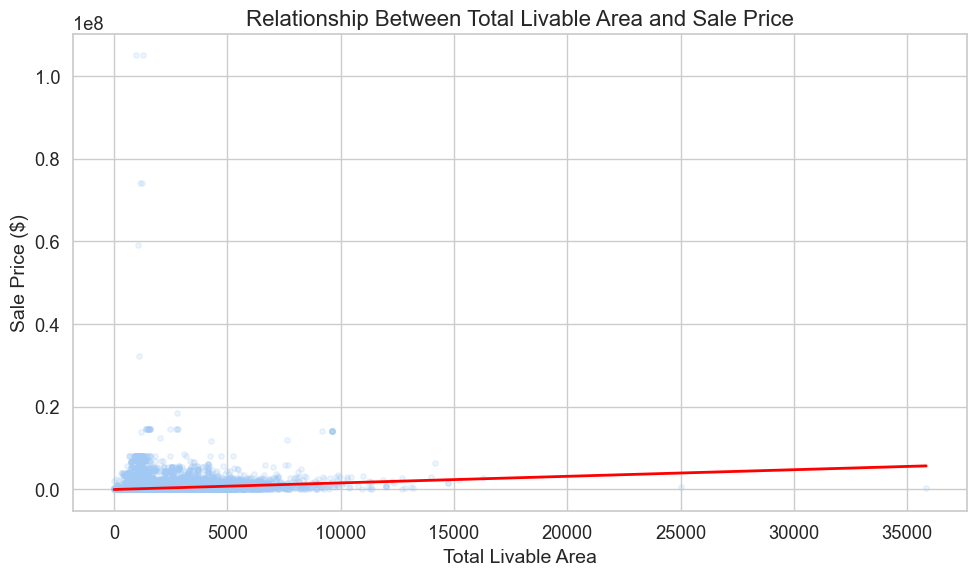

In [28]:
# total_livable_area

sns.set(style="whitegrid", palette="pastel", font_scale=1.2)

data = gdf_properties_cleaned1[['sale_price', 'total_livable_area']]

plt.figure(figsize=(10, 6))
sns.regplot(x='total_livable_area', y='sale_price', data=data, scatter_kws={'alpha':0.2, 's':15}, line_kws={"color":"red", "lw":2})

plt.title('Relationship Between Total Livable Area and Sale Price', fontsize=16)
plt.xlabel('Total Livable Area', fontsize=14)
plt.ylabel('Sale Price ($)', fontsize=14)

plt.tight_layout()
plt.show()


In [29]:
# Remove entries from gdf_properties_cleaned1 where total_livable_area is greater than 20000.
gdf_properties_cleaned1 = gdf_properties_cleaned1[
    (gdf_properties_cleaned1['total_livable_area'] > 0) &
    (gdf_properties_cleaned1['total_livable_area'] <= 20000)
]

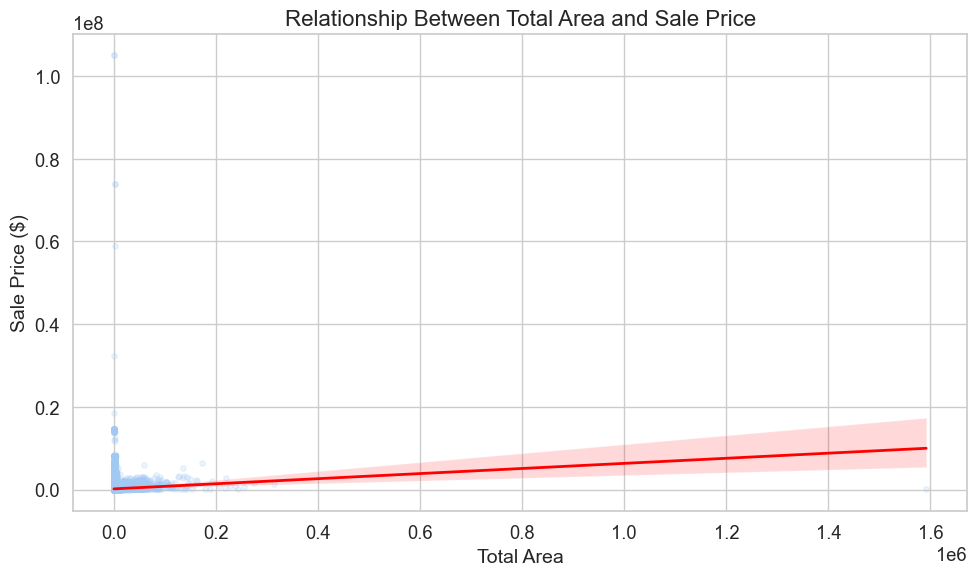

In [30]:
# total_area

sns.set(style="whitegrid", palette="pastel", font_scale=1.2)

data = gdf_properties_cleaned1[['sale_price', 'total_area']]

plt.figure(figsize=(10, 6))
sns.regplot(x='total_area', y='sale_price', data=data, scatter_kws={'alpha':0.2, 's':15}, line_kws={"color":"red", "lw":2})

plt.title('Relationship Between Total Area and Sale Price', fontsize=16)
plt.xlabel('Total Area', fontsize=14)
plt.ylabel('Sale Price ($)', fontsize=14)

plt.tight_layout()
plt.show()


In [31]:
# Remove entries from gdf_properties_cleaned1 where total_area is greater than 350,000.
gdf_properties_cleaned1 = gdf_properties_cleaned1[
    (gdf_properties_cleaned1['total_area'] > 0) &
    (gdf_properties_cleaned1['total_area'] <= 350000)
]

In [32]:
# year_built to age

current_year = datetime.now().year
gdf_properties_cleaned1['age'] = current_year - gdf_properties_cleaned1['year_built']
gdf_properties_cleaned1 = gdf_properties_cleaned1.drop(columns=['year_built'])


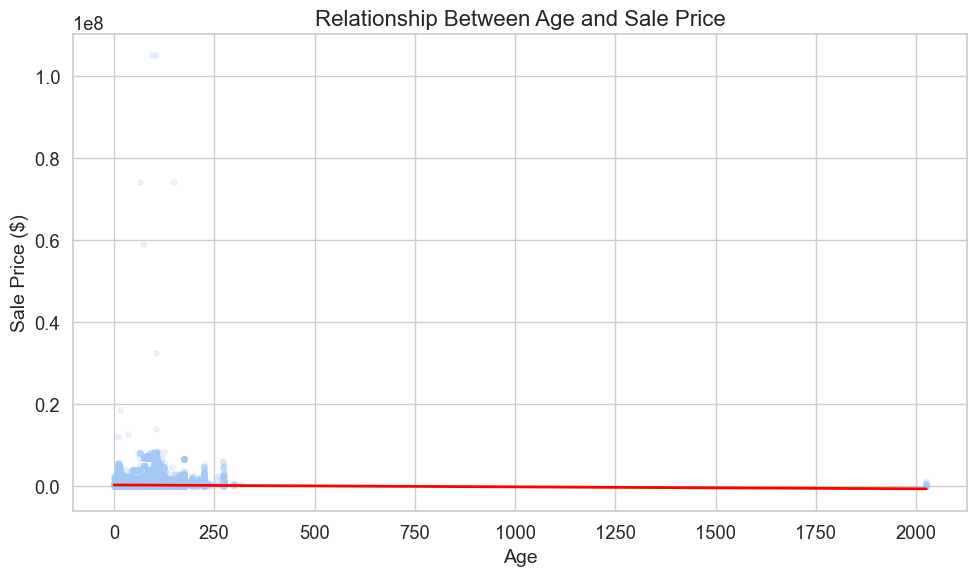

In [33]:
# age

sns.set(style="whitegrid", palette="pastel", font_scale=1.2)

data = gdf_properties_cleaned1[['sale_price', 'age']]

plt.figure(figsize=(10, 6))
sns.regplot(x='age', y='sale_price', data=data, scatter_kws={'alpha':0.2, 's':15}, line_kws={"color":"red", "lw":2})

plt.title('Relationship Between Age and Sale Price', fontsize=16)
plt.xlabel('Age', fontsize=14)
plt.ylabel('Sale Price ($)', fontsize=14)

plt.tight_layout()
plt.show()


In [34]:
# Remove entries from gdf_properties_cleaned1 where age is greater than 350,000.
gdf_properties_cleaned1 = gdf_properties_cleaned1[gdf_properties_cleaned1['age'] <= 500]

- Check categorical variables for linearity. (sale_price - category_code, census_tract, exterior_condition, general_construction, interior_condition, parcel_shape, quality_grade, topography, view_type, zoning)

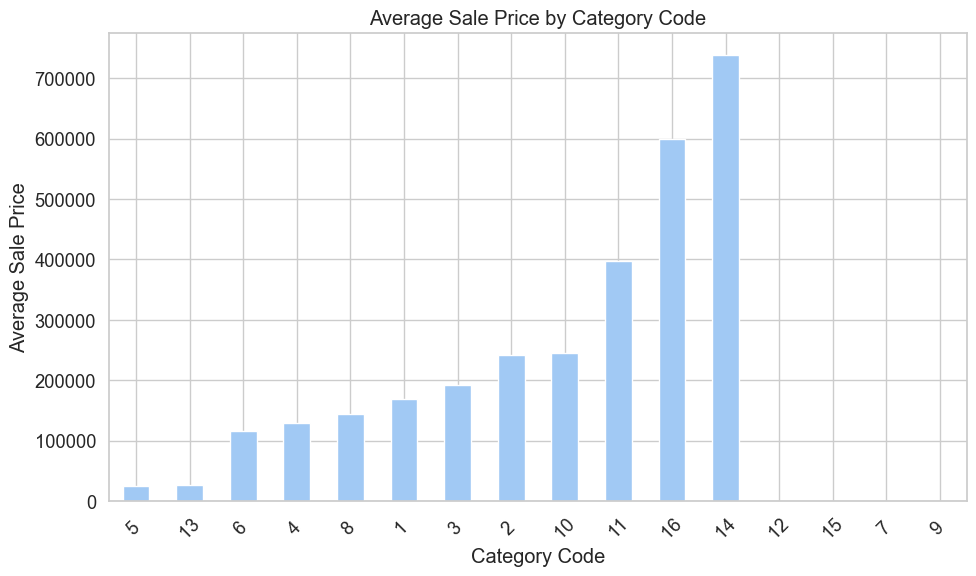

In [35]:
# category_code

avg_prices = gdf_properties_cleaned1.groupby('category_code')['sale_price'].mean().sort_values()

plt.figure(figsize=(10, 6))
avg_prices.plot(kind='bar')
plt.title('Average Sale Price by Category Code')
plt.xlabel('Category Code')
plt.ylabel('Average Sale Price')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


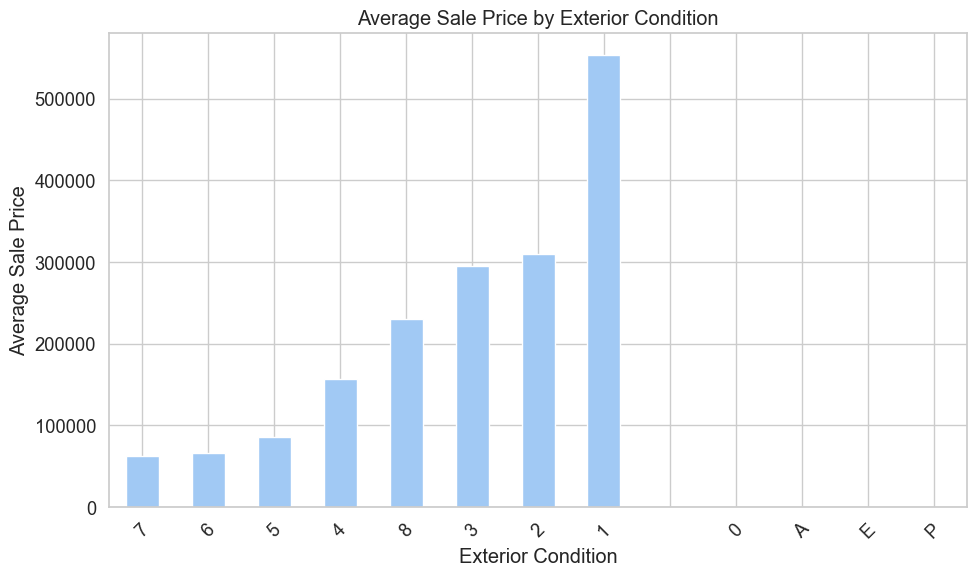

In [36]:
# exterior_condition

avg_prices = gdf_properties_cleaned1.groupby('exterior_condition')['sale_price'].mean().sort_values()

plt.figure(figsize=(10, 6))
avg_prices.plot(kind='bar')
plt.title('Average Sale Price by Exterior Condition')
plt.xlabel('Exterior Condition')
plt.ylabel('Average Sale Price')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


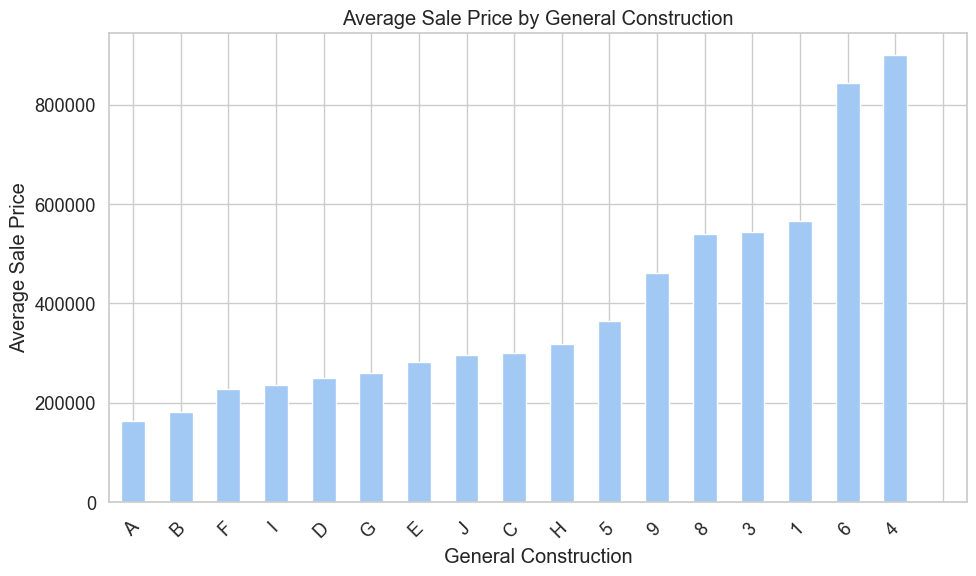

In [37]:
# general_construction

avg_prices = gdf_properties_cleaned1.groupby('general_construction')['sale_price'].mean().sort_values()

plt.figure(figsize=(10, 6))
avg_prices.plot(kind='bar')
plt.title('Average Sale Price by General Construction')
plt.xlabel('General Construction')
plt.ylabel('Average Sale Price')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


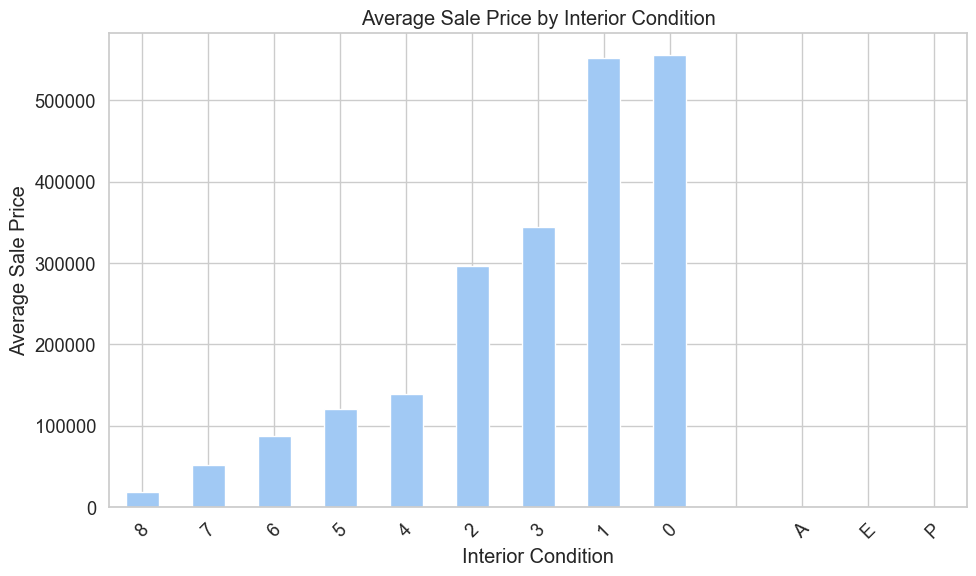

In [38]:
# interior_condition

avg_prices = gdf_properties_cleaned1.groupby('interior_condition')['sale_price'].mean().sort_values()

plt.figure(figsize=(10, 6))
avg_prices.plot(kind='bar')
plt.title('Average Sale Price by Interior Condition')
plt.xlabel('Interior Condition')
plt.ylabel('Average Sale Price')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


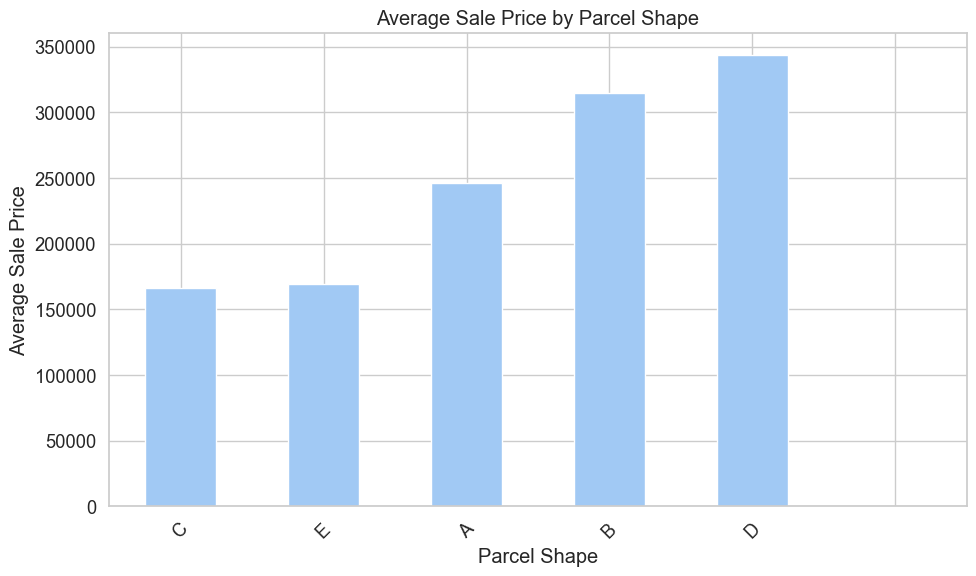

In [39]:
# parcel_shape

avg_prices = gdf_properties_cleaned1.groupby('parcel_shape')['sale_price'].mean().sort_values()

plt.figure(figsize=(10, 6))
avg_prices.plot(kind='bar')
plt.title('Average Sale Price by Parcel Shape')
plt.xlabel('Parcel Shape')
plt.ylabel('Average Sale Price')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


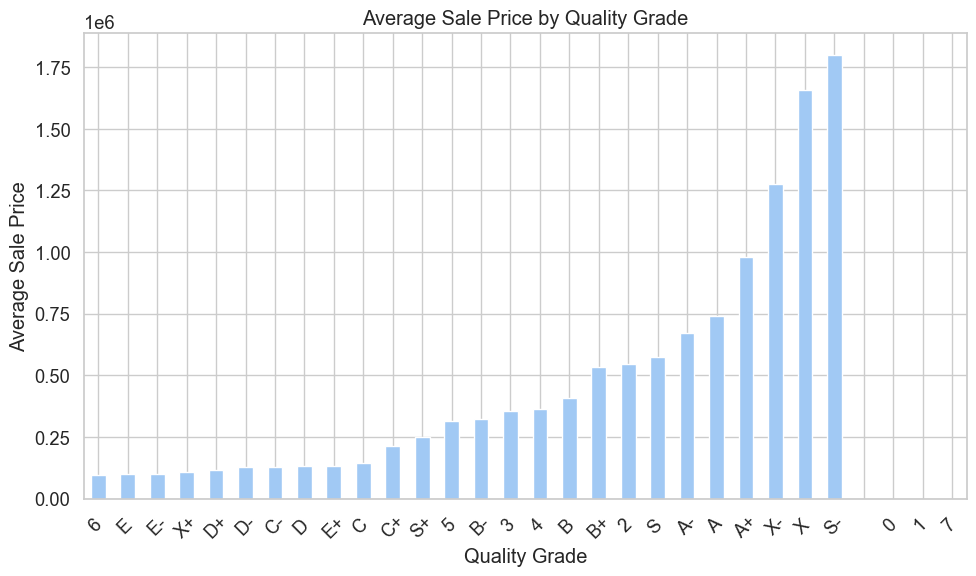

In [40]:
# quality_grade

avg_prices = gdf_properties_cleaned1.groupby('quality_grade')['sale_price'].mean().sort_values()

plt.figure(figsize=(10, 6))
avg_prices.plot(kind='bar')
plt.title('Average Sale Price by Quality Grade')
plt.xlabel('Quality Grade')
plt.ylabel('Average Sale Price')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


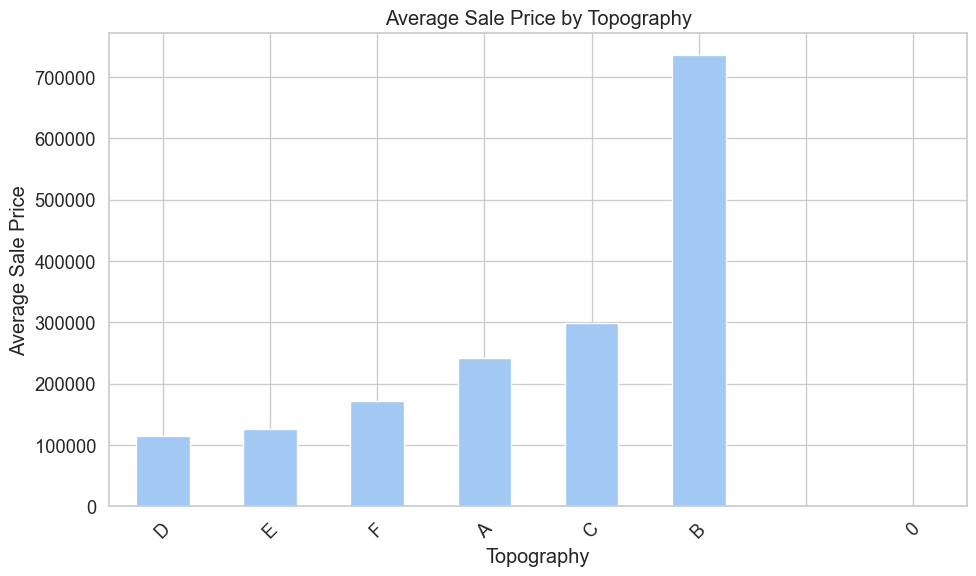

In [41]:
# topography

avg_prices = gdf_properties_cleaned1.groupby('topography')['sale_price'].mean().sort_values()

plt.figure(figsize=(10, 6))
avg_prices.plot(kind='bar')
plt.title('Average Sale Price by Topography')
plt.xlabel('Topography')
plt.ylabel('Average Sale Price')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


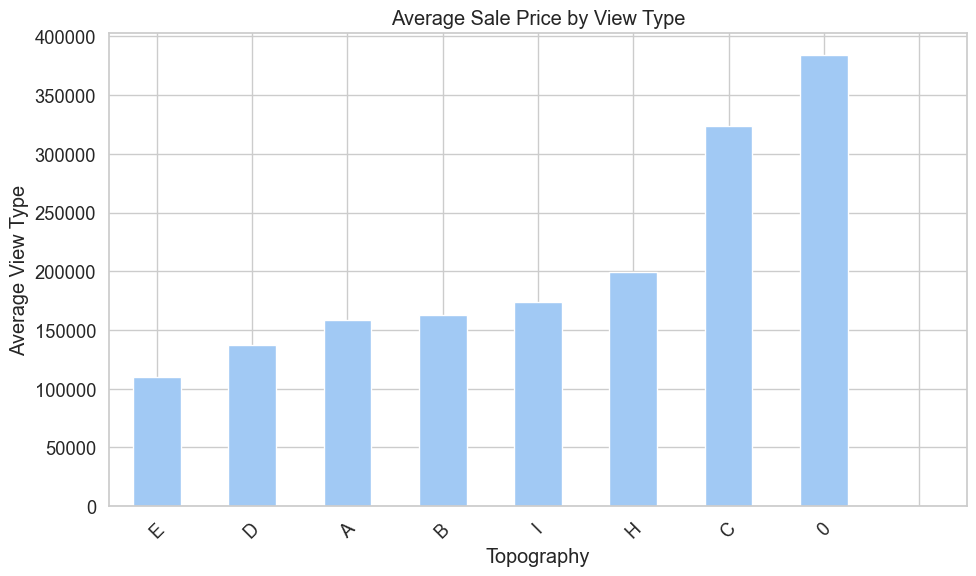

In [42]:
# view_type

avg_prices = gdf_properties_cleaned1.groupby('view_type')['sale_price'].mean().sort_values()

plt.figure(figsize=(10, 6))
avg_prices.plot(kind='bar')
plt.title('Average Sale Price by View Type')
plt.xlabel('Topography')
plt.ylabel('Average View Type')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


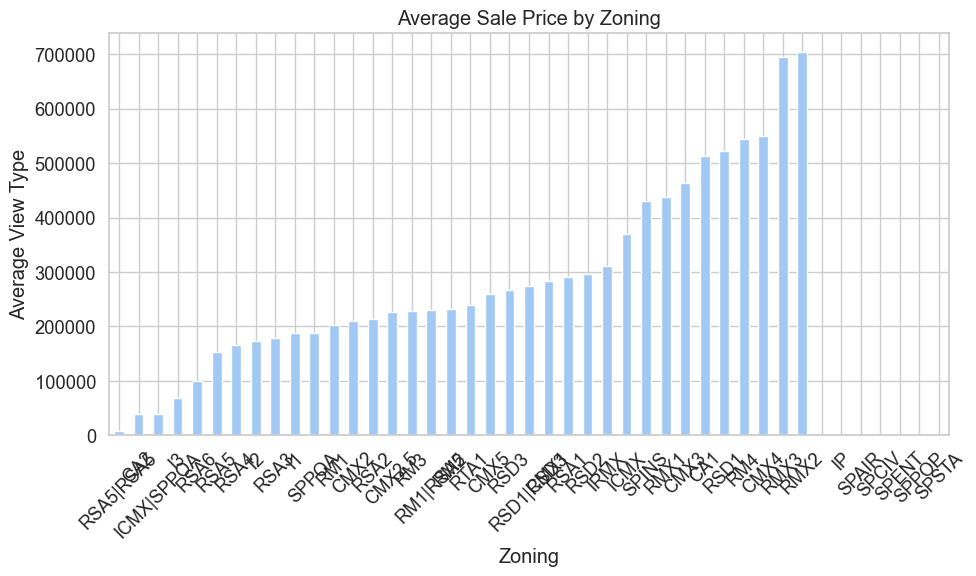

In [43]:
# zoning

avg_prices = gdf_properties_cleaned1.groupby('zoning')['sale_price'].mean().sort_values()

plt.figure(figsize=(10, 6))
avg_prices.plot(kind='bar')
plt.title('Average Sale Price by Zoning')
plt.xlabel('Zoning')
plt.ylabel('Average View Type')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


# 2 Modeling

## 2.1 Potential Models

### 2.1.1 Basic

In [44]:
# basic
basic = gdf_properties_cleaned1.copy()

X_variable_basic = basic.drop(columns=['geometry', 'sale_price'])
y_variable_basic = basic['sale_price']

X_encoded_basic = pd.get_dummies(X_variable_basic, drop_first=True)

X_train_basic, X_test_basic, y_train_basic, y_test_basic = train_test_split(
    X_encoded_basic, y_variable_basic, test_size=0.2, random_state=42
)

model_basic = LinearRegression()
model_basic.fit(X_train_basic, y_train_basic)

X_train_basic_sm = sm.add_constant(X_train_basic)
model_sm_basic = sm.OLS(y_train_basic, X_train_basic_sm).fit()
summary_basic = summary_col([model_sm_basic], stars=True)

print(summary_basic)



                           sale_price   
----------------------------------------
const                   60396.2493      
                        (45952.8547)    
depth                   -91.6949***     
                        (25.2941)       
fireplaces              53832.9656***   
                        (3527.2770)     
frontage                -13.7633        
                        (21.7630)       
garage_spaces           17532.5652***   
                        (1834.8742)     
number_of_bathrooms     47307.8543***   
                        (1805.0731)     
number_of_bedrooms      -3717.2418***   
                        (964.3167)      
number_stories          -6558.3975***   
                        (2124.5347)     
off_street_open         4.2238***       
                        (1.0282)        
total_area              1.4559***       
                        (0.3851)        
total_livable_area      69.5876***      
                        (2.3565)        
age            

### 2.1.2 Basic - log

In [45]:
basic2 = basic.copy()
basic2['sale_price'] = np.log(basic['sale_price'])

X_variable_basic2 = basic2.drop(columns=['geometry', 'sale_price'])
y_variable_basic2 = basic2['sale_price']

X_encoded_basic2 = pd.get_dummies(X_variable_basic2, drop_first=True)

X_train_basic2, X_test_basic2, y_train_basic2, y_test_basic2 = train_test_split(
    X_encoded_basic2, y_variable_basic2, test_size=0.2, random_state=42
)

model_basic2 = LinearRegression()
model_basic2.fit(X_train_basic2, y_train_basic2)

X_train_basic2_sm = sm.add_constant(X_train_basic2)
model_sm_basic2 = sm.OLS(y_train_basic2, X_train_basic2_sm).fit()
summary_basic2 = summary_col([model_sm_basic2], stars=True)

print(summary_basic2)


                        sale_price
----------------------------------
const                   5.8264*** 
                        (0.0902)  
depth                   0.0005*** 
                        (0.0000)  
fireplaces              0.0686*** 
                        (0.0069)  
frontage                0.0000    
                        (0.0000)  
garage_spaces           0.0569*** 
                        (0.0036)  
number_of_bathrooms     0.1909*** 
                        (0.0035)  
number_of_bedrooms      -0.0138***
                        (0.0019)  
number_stories          0.0145*** 
                        (0.0042)  
off_street_open         0.0000*** 
                        (0.0000)  
total_area              0.0000    
                        (0.0000)  
total_livable_area      0.0002*** 
                        (0.0000)  
age                     -0.0008***
                        (0.0001)  
category_code_10        0.4709    
                        (0.8091)  
category_code_11   

### 2.1.3 Trimmed 1

In [46]:
def simplify_category_code_column(df, column, keep_list):
    keep_set = set(map(str, keep_list)) 

    def simplify(val):
        val_str = str(val).strip() 
        return val_str if val_str in keep_set else 'other'

    df = df.copy()
    df[column] = df[column].apply(simplify)
    df[column] = pd.Categorical(df[column])
    return df

In [47]:
# trimmed 1 - Given a lot of categorical variables are not significant across all their dummies. we re-bin them.

trimmed1 = gdf_properties_cleaned1.copy()

trimmed1 = simplify_category_code_column(
    trimmed1,
    column='category_code',
    keep_list=[13, 16, 8] 
)

trimmed1 = simplify_category_code_column(
    trimmed1,
    column='general_construction',
    keep_list=[3, 4, 6, 'B', 'E', 'G', 'H'] 
)

trimmed1 = simplify_category_code_column(
    trimmed1,
    column='interior_condition',
    keep_list=[1, 6, 7] 
)

trimmed1 = simplify_category_code_column(
    trimmed1,
    column='quality_grade',
    keep_list=['A+', 'A-', 'B', 'B-', 'C', 'C+', 'C-', 'D', 'X', 'X+'] 
)

trimmed1 = simplify_category_code_column(
    trimmed1,
    column='topography',
    keep_list=['B'] 
)

trimmed1 = simplify_category_code_column(
    trimmed1,
    column='view_type',
    keep_list=['A', 'C', 'E'] 
)

trimmed1 = simplify_category_code_column(
    trimmed1,
    column='zoning',
    keep_list=['CMX4', 'CMX5', 'ICMX', 'RM1', 'RM4', 'RMX3'] 
)

trimmed1 = trimmed1.drop(columns=['frontage', 'total_area', 'exterior_condition', 'parcel_shape'], errors='ignore')

In [48]:
# trimmed 1

X_variable_trimmed1 = trimmed1.drop(columns=['geometry', 'sale_price'])
y_variable_trimmed1 = trimmed1['sale_price']

X_encoded_trimmed1 = pd.get_dummies(X_variable_trimmed1, drop_first=True)

X_train_trimmed1, X_test_trimmed1, y_train_trimmed1, y_test_trimmed1 = train_test_split(
    X_encoded_trimmed1, y_variable_trimmed1, test_size=0.2, random_state=42
)

model_trimmed1 = LinearRegression()
model_trimmed1.fit(X_train_trimmed1, y_train_trimmed1)

X_train_trimmed1_sm = sm.add_constant(X_train_trimmed1)
model_sm_trimmed1 = sm.OLS(y_train_trimmed1, X_train_trimmed1_sm).fit()
summary_trimmed1 = summary_col([model_sm_trimmed1], stars=True)

print(summary_trimmed1)


                              sale_price   
-------------------------------------------
const                      398436.6798     
                           (414311.9986)   
depth                      -77.8150***     
                           (24.3862)       
fireplaces                 58593.9799***   
                           (3467.7039)     
garage_spaces              17341.3777***   
                           (1829.7841)     
number_of_bathrooms        65795.1275***   
                           (1726.5491)     
number_of_bedrooms         -8138.1426***   
                           (923.6050)      
number_stories             -6704.4432***   
                           (2108.1960)     
off_street_open            3.6944***       
                           (1.0262)        
total_livable_area         77.0592***      
                           (2.1080)        
age                        -186.4106***    
                           (48.0924)       
category_code_16           -158

### 2.1.4 Trimmed 2

In [49]:
# trimmed 2 - log sale price

trimmed2 = gdf_properties_cleaned1.copy()

trimmed2 = simplify_category_code_column(
    trimmed2,
    column='category_code',
    keep_list=[11, 12, 13, 14, 15, 2, 8, 9, 16, 8] 
)

trimmed2 = simplify_category_code_column(
    trimmed2,
    column='exterior_condition',
    keep_list=[1, 2, 3, 4, 5, 6, 7, 8] 
)


trimmed2 = simplify_category_code_column(
    trimmed2,
    column='general_construction',
    keep_list=[3, 4, 5, 6, 9, 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J'] 
)

trimmed2 = simplify_category_code_column(
    trimmed2,
    column='interior_condition',
    keep_list=[0, 1, 2, 3, 4, 5, 6, 7, 'A'] 
)

trimmed2 = simplify_category_code_column(
    trimmed2,
    column='parcel_shape',
    keep_list=['A', 'B', 'C', 'D', 'E'] 
)

trimmed2 = simplify_category_code_column(
    trimmed2,
    column='quality_grade',
    keep_list=[0, 3, 4, 6, 7, 'A+', 'A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-', 'D', 'D+', 'D-', 'E', 'E+', 'E-', 'S', 'S-', 'X', 'X+', 'X-'] 
)

trimmed2 = simplify_category_code_column(
    trimmed2,
    column='zoning',
    keep_list=['CA1', 'CMX1', 'CMX2', 'CMX2.5', 'I1', 'I2', 'I3', 'ICMX', 'IRMX', 'RM1', 'RM2', 'RM3', 'RM4', 'RMX1', 'RMX2', 'RMX3',
               'RSA1', 'RSA2', 'RSA3', 'RSA4', 'RSA5', 'RSA5|RSA5', 'RSD1', 'RSD2', 'RSD3', 'RTA1', 'SPINS'] 
)

trimmed2 = trimmed2.drop(columns=['frontage', 'number_stories', 'total_area'], errors='ignore')

trimmed2['sale_price'] = np.log(gdf_properties_cleaned1['sale_price'])

In [50]:
X_variable_trimmed2 = trimmed2.drop(columns=['geometry', 'sale_price'])
y_variable_trimmed2 = trimmed2['sale_price']

X_encoded_trimmed2 = pd.get_dummies(X_variable_trimmed2, drop_first=True)


In [51]:
X_train_trimmed2, X_test_trimmed2, y_train_trimmed2, y_test_trimmed2 = train_test_split(
    X_encoded_trimmed2, y_variable_trimmed2, test_size=0.2, random_state=42
)

In [53]:
model_trimmed2 = LinearRegression()

In [54]:
model_trimmed2.fit(X_train_trimmed2, y_train_trimmed2)

LinearRegression()

In [55]:
# trimmed 2
X_train_trimmed2_sm = sm.add_constant(X_train_trimmed2)
model_sm_trimmed2 = sm.OLS(y_train_trimmed2, X_train_trimmed2_sm).fit()
summary_trimmed2 = summary_col([model_sm_trimmed2], stars=True)

print(summary_trimmed2)


                           sale_price
-------------------------------------
const                      9.0834*** 
                           (0.4386)  
depth                      0.0005*** 
                           (0.0000)  
fireplaces                 0.0698*** 
                           (0.0069)  
garage_spaces              0.0562*** 
                           (0.0036)  
number_of_bathrooms        0.1909*** 
                           (0.0035)  
number_of_bedrooms         -0.0138***
                           (0.0019)  
off_street_open            0.0000*** 
                           (0.0000)  
total_livable_area         0.0002*** 
                           (0.0000)  
age                        -0.0007***
                           (0.0001)  
category_code_13           -1.2561   
                           (0.9247)  
category_code_14           -1.2859***
                           (0.4805)  
category_code_16           -4.9033***
                           (0.9751)  
category_co

### 2.1.5 Trimmed 3

In [104]:
# trimmed 3 - log sale price and independent variables + geo_lag

trimmed3_pre = gdf_properties_cleaned1.copy()

trimmed3_pre['avg_price1'] = trimmed3_pre['sale_price'] / trimmed3_pre['total_area']
trimmed3_pre['avg_price2'] = trimmed3_pre['sale_price'] / trimmed3_pre['total_livable_area']

trimmed3_pre['sale_price'] = np.log(gdf_properties_cleaned1['sale_price'])

for col in trimmed3_pre.select_dtypes(include='category').columns:
    trimmed3_pre[col] = trimmed3_pre[col].cat.remove_unused_categories()

In [105]:
def compute_knn_lag_fast(df, geometry_col, value_cols, k=5):
    coords = np.array([[pt.y, pt.x] for pt in df[geometry_col]])
    nn = NearestNeighbors(n_neighbors=k + 1, algorithm='ball_tree', metric='euclidean')
    nn.fit(coords)
    _, indices = nn.kneighbors(coords)

    for val_col in value_cols:
        values = df[val_col].to_numpy()
        neighbor_values = values[indices[:, 1:]]
        lagged_means = np.nanmean(neighbor_values, axis=1)
        df[f'lag_{val_col}'] = lagged_means

    return df

In [106]:
trimmed3_pre = compute_knn_lag_from_geometry(
    df=trimmed3_pre,
    geometry_col='geometry',
    value_cols=['avg_price1', 'avg_price2', 'sale_price'],
    k=10
)

In [199]:
trimmed3=trimmed3_pre.copy()

In [200]:
# for col in X_variable_trimmed3.columns:
#     if is_categorical_dtype(X_variable_trimmed3[col]):
#         base = X_variable_trimmed3[col].cat.categories[0]
#     elif is_object_dtype(X_variable_trimmed3[col]):
#         base = sorted(X_variable_trimmed3[col].dropna().unique())[0] if X_variable_trimmed3[col].notna().any() else ''
#     else:
#         continue
#     print(f"{col} ➜ 被 drop 掉的 base level: {base}")

category_code ➜ 被 drop 掉的 base level: 1
census_tract ➜ 被 drop 掉的 base level: 1  
exterior_condition ➜ 被 drop 掉的 base level: 1
general_construction ➜ 被 drop 掉的 base level: 1
interior_condition ➜ 被 drop 掉的 base level: 0
parcel_shape ➜ 被 drop 掉的 base level: A
quality_grade ➜ 被 drop 掉的 base level: 6
topography ➜ 被 drop 掉的 base level: B
view_type ➜ 被 drop 掉的 base level: 0
zoning ➜ 被 drop 掉的 base level: CA1


In [201]:
trimmed3 = simplify_category_code_column(
    trimmed3,
    column='category_code',
    keep_list=[11, 14, 16, 1, 2] 
)

trimmed3 = simplify_category_code_column(
    trimmed3,
    column='exterior_condition',
    keep_list=[1, 2, 3, 4, 5, 6, 7] 
)

trimmed3 = simplify_category_code_column(
    trimmed3,
    column='general_construction',
    keep_list=[1, 3, 5] 
)

trimmed3 = simplify_category_code_column(
    trimmed3,
    column='interior_condition',
    keep_list=[0, 4, 5, 6, 7, 8] 
)

trimmed3 = simplify_category_code_column(
    trimmed3,
    column='parcel_shape',
    keep_list=['A', 'B', 'E'] 
)

trimmed3 = simplify_category_code_column(
    trimmed3,
    column='quality_grade',
    keep_list=[0,6,'X+'] 
)

trimmed3 = simplify_category_code_column(
    trimmed3,
    column='topography',
    keep_list=[0,'B'] 
)

trimmed3 = simplify_category_code_column(
    trimmed3,
    column='view_type',
    keep_list=[0, 'E'] 
)

trimmed3 = simplify_category_code_column(
    trimmed3,
    column='zoning',
    keep_list=['CA1', 'CMX1', 'CMX2', 'CMX2.5', 'CMX3', 'CMX4', 'I1', 'I2', 'I3', 'ICMX', 'ICMX', 'ICMX|SPPOA', 'RM1', 'RM2', 'RM4', 'RMX2',
              'RSA2', 'RSA3', 'RSA4', 'RSA5', 'RSA5|RSA5', 'RSA6', 'RSD1', 'RSD2', 'RSD3', 'RTA1'] 
)


In [202]:
def add_log_columns(df, exclude=[]):
    numeric_cols = df.select_dtypes(include=['number']).columns
    for col in numeric_cols:
        if col not in exclude:
            df[f"{col}_log"] = np.log1p(df[col]) 
    return df

In [203]:
trimmed3 = add_log_columns(trimmed3, exclude=['sale_price','geometry'])

In [204]:
trimmed3.columns

Index(['category_code', 'census_tract', 'depth', 'exterior_condition',
       'fireplaces', 'frontage', 'garage_spaces', 'general_construction',
       'interior_condition', 'number_of_bathrooms', 'number_of_bedrooms',
       'number_stories', 'off_street_open', 'parcel_shape', 'quality_grade',
       'sale_price', 'topography', 'total_area', 'total_livable_area',
       'view_type', 'zoning', 'geometry', 'age', 'avg_price1', 'avg_price2',
       'lag_avg_price1', 'lag_avg_price2', 'lag_sale_price', 'depth_log',
       'fireplaces_log', 'frontage_log', 'garage_spaces_log',
       'number_of_bathrooms_log', 'number_of_bedrooms_log',
       'number_stories_log', 'off_street_open_log', 'total_area_log',
       'total_livable_area_log', 'age_log', 'avg_price1_log', 'avg_price2_log',
       'lag_avg_price1_log', 'lag_avg_price2_log', 'lag_sale_price_log'],
      dtype='object')

In [205]:
trimmed3 = trimmed3.drop(columns=['avg_price1', 'avg_price2', 'avg_price1_log', 'avg_price2_log',
                                 'garage_spaces', 'off_street_open', 'total_area', 'frontage_log',
                                 'lag_avg_price2_log', 'age', 'age_log'], errors='ignore')

In [206]:
X_variable_trimmed3 = trimmed3.drop(columns=['geometry', 'sale_price'])
y_variable_trimmed3 = trimmed3['sale_price']

X_encoded_trimmed3 = pd.get_dummies(X_variable_trimmed3, drop_first=True)

X_train_trimmed3, X_test_trimmed3, y_train_trimmed3, y_test_trimmed3 = train_test_split(
    X_encoded_trimmed3, y_variable_trimmed3, test_size=0.2, random_state=42
)

model_trimmed3 = LinearRegression()
model_trimmed3.fit(X_train_trimmed3, y_train_trimmed3)

X_train_trimmed3_sm = sm.add_constant(X_train_trimmed3)
model_sm_trimmed3 = sm.OLS(y_train_trimmed3, X_train_trimmed3_sm).fit()
summary_trimmed3 = summary_col([model_sm_trimmed3], stars=True)

print(summary_trimmed3)


                           sale_price
-------------------------------------
const                      18.6315***
                           (1.5882)  
depth                      0.0003*** 
                           (0.0001)  
fireplaces                 -0.0498** 
                           (0.0246)  
frontage                   -0.0001*  
                           (0.0000)  
number_of_bathrooms        0.0974*** 
                           (0.0117)  
number_of_bedrooms         -0.0613***
                           (0.0068)  
number_stories             0.3402*** 
                           (0.0270)  
total_livable_area         -0.0000***
                           (0.0000)  
lag_avg_price1             0.0000*** 
                           (0.0000)  
lag_avg_price2             0.0002*** 
                           (0.0000)  
lag_sale_price             0.9396*** 
                           (0.0724)  
depth_log                  -0.0705***
                           (0.0113)  
fireplaces_

## 2.2 Selection

- We trained five models and compared their performance.

In [271]:
model_comparison = pd.DataFrame({
    'Model': ['model_basic', 'model_basic2', 'model_trimmed1', 'model_trimmed2', 'model_trimmed3'],
    'Note': [
        'price - all potential variables',
        'price(log) - all potential variables',
        'price - trimmed variables',
        'price(log) - trimmed variables',
        'price(log) - trimmed variables and geo lag variables with their log forms'
    ],
    'R²': [
        model_sm_basic.rsquared,
        model_sm_basic2.rsquared,
        model_sm_trimmed1.rsquared,
        model_sm_trimmed2.rsquared,
        model_sm_trimmed3.rsquared
    ],
    'Adj. R²': [
        model_sm_basic.rsquared_adj,
        model_sm_basic2.rsquared_adj,
        model_sm_trimmed1.rsquared_adj,
        model_sm_trimmed2.rsquared_adj,
        model_sm_trimmed3.rsquared_adj
    ],
    'Vars': [
        len(model_sm_basic.params) - 1,
        len(model_sm_basic2.params) - 1,
        len(model_sm_trimmed1.params) - 1,
        len(model_sm_trimmed2.params) - 1,
        len(model_sm_trimmed3.params) - 1
    ]
})

model_comparison

,Model,Note,R²,Adj. R²,Vars
0,model_basic,price - all potential variables,0.109794,0.108213,486
1,model_basic2,price(log) - all potential variables,0.485029,0.484114,486
2,model_trimmed1,price - trimmed variables,0.103382,0.102098,370
3,model_trimmed2,price(log) - trimmed variables,0.484903,0.484025,442
4,model_trimmed3,price(log) - trimmed variables and geo lag var...,0.493764,0.492974,391


In [272]:
def evaluate_model(model, X_test, y_test, log_transformed=False):
    y_pred = model.predict(X_test)
    
    if log_transformed:
        y_pred = np.exp(y_pred)
        y_test = np.exp(y_test)

    mae = mean_absolute_error(y_test, y_pred)
    rmse = mean_squared_error(y_test, y_pred, squared=False)
    nrmse = rmse / np.mean(y_test)
    return mae, rmse, nrmse

In [273]:
def pred(model, X_test, log_transformed=False):
    y_pred = model.predict(X_test)
    
    if log_transformed:
        y_pred = np.exp(y_pred)
        
    return y_pred

In [274]:
mae1, rmse1, nrmse1 = evaluate_model(model_basic, X_test_basic, y_test_basic)
mae2, rmse2, nrmse2 = evaluate_model(model_basic2, X_test_basic2, y_test_basic2, log_transformed=True)
mae3, rmse3, nrmse3 = evaluate_model(model_trimmed1, X_test_trimmed1, y_test_trimmed1)
mae4, rmse4, nrmse4 = evaluate_model(model_trimmed2, X_test_trimmed2, y_test_trimmed2, log_transformed=True)
mae5, rmse5, nrmse5 = evaluate_model(model_trimmed3, X_test_trimmed3, y_test_trimmed3, log_transformed=True)

In [275]:
model_comparison['MAE'] = [mae1, mae2, mae3, mae4, mae5]
model_comparison['RMSE'] = [rmse1, rmse2, rmse3, rmse4, rmse5]
model_comparison['NRMSE'] = [nrmse1, nrmse2, nrmse3, nrmse4, nrmse5]

In [276]:
model_comparison

,Model,Note,R²,Adj. R²,Vars,MAE,RMSE,NRMSE
0,model_basic,price - all potential variables,0.109794,0.108213,486,2.165072e+07,5.393428e+09,30398.463961
1,model_basic2,price(log) - all potential variables,0.485029,0.484114,486,8.961399e+04,5.841138e+05,3.292185
2,model_trimmed1,price - trimmed variables,0.103382,0.102098,370,9.959244e+04,5.648247e+05,3.183468
3,model_trimmed2,price(log) - trimmed variables,0.484903,0.484025,442,8.966294e+04,5.847615e+05,3.295836
4,model_trimmed3,price(log) - trimmed variables and geo lag var...,0.493764,0.492974,391,8.766570e+04,5.633366e+05,3.175080


- model_trimmed3 wins because it combines efficient feature selection with spatial price smoothing via geo lag variables — achieving the best balance of interpretability and predictive accuracy.

## 2.3 Presentation

In [255]:
result = trimmed3[['sale_price', 'geometry']].copy()
result['sale_price'] = np.exp(result['sale_price'])
result['predicted_price'] = pred(model_trimmed3, X_encoded_trimmed3, log_transformed=True)
result['error'] = np.abs(result['sale_price'] - result['predicted_price'])
result['error_per'] = np.abs(result['error']/result['sale_price'])

result

,sale_price,geometry,predicted_price,error,error_per
2,550000.0,POINT (40.06824 -75.06515),717323.592782,167323.592782,0.304225
3,285000.0,POINT (40.06148 -75.03063),121270.873416,163729.126584,0.574488
5,355000.0,POINT (40.03783 -75.06506),119591.073758,235408.926242,0.663124
6,50000.0,POINT (40.02145 -75.12155),61402.130418,11402.130418,0.228043
9,210000.0,POINT (39.97363 -75.15380),80369.778929,129630.221071,0.617287
...,...,...,...,...,...
584063,14000.0,POINT (40.00214 -75.06746),72471.068523,58471.068523,4.176505
584067,6500.0,POINT (39.99841 -75.17733),23277.574397,16777.574397,2.581165
584073,22460.0,POINT (39.90526 -75.24624),91191.390013,68731.390013,3.060169
584088,21500.0,POINT (40.05425 -74.99672),156309.231726,134809.231726,6.270197


In [293]:
def plot_heatmap(result, value_col='predicted_price'):
    result = result.copy()
    result['lat'] = result.geometry.x
    result['lon'] = result.geometry.y

    base_map = folium.Map(
        location=[result['lat'].mean(), result['lon'].mean()],
        zoom_start=12,
        tiles='cartodbpositron'
    )

    heat_data = [[row['lat'], row['lon'], row[value_col]] for _, row in result.iterrows()]
    HeatMap(heat_data, radius=10, blur=15, max_zoom=1).add_to(base_map)

    return base_map

In [296]:
def plot_predicted_price_map(result_gdf, price_col='predicted_price', tooltip_col='predicted_price'):
    if not isinstance(result_gdf, gpd.GeoDataFrame):
        result_gdf = gpd.GeoDataFrame(result_gdf, geometry='geometry')

    center = [result_gdf.geometry.x.mean(), result_gdf.geometry.y.mean()]
    m = folium.Map(location=center, zoom_start=12, tiles='cartodbpositron')

    marker_cluster = MarkerCluster().add_to(m)
    for _, row in result_gdf.iterrows():
        folium.CircleMarker(
            location=[row.geometry.x, row.geometry.y],
            radius=4,
            color=None,
            fill=True,
            fill_color='blue',
            fill_opacity=0.5,
            tooltip=f"${row[tooltip_col]:,.0f}"
        ).add_to(marker_cluster)

    return m

In [294]:
map_obj = plot_heatmap(result, value_col='predicted_price')
map_obj